The film industry is more well-liked than ever in a world where movies reportedly grossed $41.7 billion in 2018. What films, however, bring in the most money at the box office? How important is a director?
In order to complete this EDA project and uncover any trends and provide some answers, we look at the Sample Movies dataset. EDA is a crucial first stage in data analysis, and we carry it out for the following reasons:
- Finding patterns in Data
- Determining relationships in Data
- Checking of assumptions
- Preliminary selection of appropriate models
- Detection of mistakes

In [29]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import pandas_profiling

In [30]:
np.set_printoptions(precision=4)

pd.set_option('mode.chained_assignment', None)
pd.set_option('display.max_colwidth', None)
pd.options.display.max_columns = 50        

warnings.filterwarnings('ignore')

%matplotlib inline

sns.set(style='whitegrid', font_scale=1.3, color_codes=True)

Loading Data

In [31]:
mov_df = pd.read_csv('https://raw.githubusercontent.com/insaid2018/Term-1/master/Data/Projects/1000%20movies%20data.csv')
mov_df.head()

,Rank,Title,Genre,Description,Director,Actors,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
0,1,Guardians of the Galaxy,"Action,Adventure,Sci-Fi",A group of intergalactic criminals are forced to work together to stop a fanatical warrior from taking control of the universe.,James Gunn,"Chris Pratt, Vin Diesel, Bradley Cooper, Zoe Saldana",2014,121,8.1,757074,333.13,76.0
1,2,Prometheus,"Adventure,Mystery,Sci-Fi","Following clues to the origin of mankind, a team finds a structure on a distant moon, but they soon realize they are not alone.",Ridley Scott,"Noomi Rapace, Logan Marshall-Green, Michael Fassbender, Charlize Theron",2012,124,7.0,485820,126.46,65.0
2,3,Split,"Horror,Thriller",Three girls are kidnapped by a man with a diagnosed 23 distinct personalities. They must try to escape before the apparent emergence of a frightful new 24th.,M. Night Shyamalan,"James McAvoy, Anya Taylor-Joy, Haley Lu Richardson, Jessica Sula",2016,117,7.3,157606,138.12,62.0
3,4,Sing,"Animation,Comedy,Family","In a city of humanoid animals, a hustling theater impresario's attempt to save his theater with a singing competition becomes grander than he anticipates even as its finalists' find that their lives will never be the same.",Christophe Lourdelet,"Matthew McConaughey,Reese Witherspoon, Seth MacFarlane, Scarlett Johansson",2016,108,7.2,60545,270.32,59.0
4,5,Suicide Squad,"Action,Adventure,Fantasy",A secret government agency recruits some of the most dangerous incarcerated super-villains to form a defensive task force. Their first mission: save the world from the apocalypse.,David Ayer,"Will Smith, Jared Leto, Margot Robbie, Viola Davis",2016,123,6.2,393727,325.02,40.0


In [32]:
mov_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Rank                1000 non-null   int64  
 1   Title               1000 non-null   object 
 2   Genre               1000 non-null   object 
 3   Description         1000 non-null   object 
 4   Director            1000 non-null   object 
 5   Actors              1000 non-null   object 
 6   Year                1000 non-null   int64  
 7   Runtime (Minutes)   1000 non-null   int64  
 8   Rating              1000 non-null   float64
 9   Votes               1000 non-null   int64  
 10  Revenue (Millions)  872 non-null    float64
 11  Metascore           936 non-null    float64
dtypes: float64(3), int64(4), object(5)
memory usage: 93.9+ KB


Therefore, there are 128 and 64 null values in Revenue and Metascore respectively.

In [33]:
mov_df.describe()

,Rank,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,872.000000,936.000000
mean,500.500000,2012.783000,113.172000,6.723200,1.698083e+05,82.956376,58.985043
std,288.819436,3.205962,18.810908,0.945429,1.887626e+05,103.253540,17.194757
min,1.000000,2006.000000,66.000000,1.900000,6.100000e+01,0.000000,11.000000
25%,250.750000,2010.000000,100.000000,6.200000,3.630900e+04,13.270000,47.000000
50%,500.500000,2014.000000,111.000000,6.800000,1.107990e+05,47.985000,59.500000
75%,750.250000,2016.000000,123.000000,7.400000,2.399098e+05,113.715000,72.000000
max,1000.000000,2016.000000,191.000000,9.000000,1.791916e+06,936.630000,100.000000


Fields having normal distribution as mean and median values are close - 
- Rank
- Year
- Runtime(Minutes)
- Metascore

Fields that are skewed - 
- Revenue
- Votes

Outliers found - 
- Runtime (Minutes) :- max(191)
- Rating :- min(1.9)
- Votes :- max(1.791916e+06)
- Revenue (Millions) :- max(936.6300)

In [34]:
#Downloads the report as an external html file
'''
profile = mov_df.profile_report(title="Pandas profiling before data processing")
profile.to_file(output_file='Movie_PreProfiling.html')

'''
#for notebook reference
mov_df.profile_report(title='Pandas profiling before data processing', html={'style':{'full_width':True}})


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Data Preprocessing

In [35]:
mov_df.head()

,Rank,Title,Genre,Description,Director,Actors,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
0,1,Guardians of the Galaxy,"Action,Adventure,Sci-Fi",A group of intergalactic criminals are forced to work together to stop a fanatical warrior from taking control of the universe.,James Gunn,"Chris Pratt, Vin Diesel, Bradley Cooper, Zoe Saldana",2014,121,8.1,757074,333.13,76.0
1,2,Prometheus,"Adventure,Mystery,Sci-Fi","Following clues to the origin of mankind, a team finds a structure on a distant moon, but they soon realize they are not alone.",Ridley Scott,"Noomi Rapace, Logan Marshall-Green, Michael Fassbender, Charlize Theron",2012,124,7.0,485820,126.46,65.0
2,3,Split,"Horror,Thriller",Three girls are kidnapped by a man with a diagnosed 23 distinct personalities. They must try to escape before the apparent emergence of a frightful new 24th.,M. Night Shyamalan,"James McAvoy, Anya Taylor-Joy, Haley Lu Richardson, Jessica Sula",2016,117,7.3,157606,138.12,62.0
3,4,Sing,"Animation,Comedy,Family","In a city of humanoid animals, a hustling theater impresario's attempt to save his theater with a singing competition becomes grander than he anticipates even as its finalists' find that their lives will never be the same.",Christophe Lourdelet,"Matthew McConaughey,Reese Witherspoon, Seth MacFarlane, Scarlett Johansson",2016,108,7.2,60545,270.32,59.0
4,5,Suicide Squad,"Action,Adventure,Fantasy",A secret government agency recruits some of the most dangerous incarcerated super-villains to form a defensive task force. Their first mission: save the world from the apocalypse.,David Ayer,"Will Smith, Jared Leto, Margot Robbie, Viola Davis",2016,123,6.2,393727,325.02,40.0


### Fixing missing values

In [36]:
#Revenue(millions) column 
mov_df['Revenue (Millions)'].isnull().sum()

128

In [37]:
mov_df[~mov_df['Revenue (Millions)'].isnull()]['Revenue (Millions)'].median()

47.985

In [38]:
#replacing missing values with the median
mov_df['Revenue (Millions)'] = mov_df['Revenue (Millions)'].replace(np.nan, mov_df[~mov_df.Metascore.isnull()]['Revenue (Millions)'].median())

In [39]:
mov_df['Revenue (Millions)'].isnull().sum()

0

In [40]:
mov_df['Metascore'].isnull().sum()
#we can drop the missing values

64

In [41]:
mov_df.dropna(subset=['Metascore'], axis = 0, inplace=True)

In [42]:
mov_df['Metascore'].isnull().sum()

0

In [43]:
mov_df.isnull().sum()

Rank                  0
Title                 0
Genre                 0
Description           0
Director              0
Actors                0
Year                  0
Runtime (Minutes)     0
Rating                0
Votes                 0
Revenue (Millions)    0
Metascore             0
dtype: int64

fixed all the missing values

Dropping 'Actors' and 'Description' as they don't provide additional insights

In [44]:
mov_df.drop(['Actors', 'Description'], axis=1, inplace = True)
mov_df.head()

,Rank,Title,Genre,Director,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
0,1,Guardians of the Galaxy,"Action,Adventure,Sci-Fi",James Gunn,2014,121,8.1,757074,333.13,76.0
1,2,Prometheus,"Adventure,Mystery,Sci-Fi",Ridley Scott,2012,124,7.0,485820,126.46,65.0
2,3,Split,"Horror,Thriller",M. Night Shyamalan,2016,117,7.3,157606,138.12,62.0
3,4,Sing,"Animation,Comedy,Family",Christophe Lourdelet,2016,108,7.2,60545,270.32,59.0
4,5,Suicide Squad,"Action,Adventure,Fantasy",David Ayer,2016,123,6.2,393727,325.02,40.0


The 'Title' column contains 'The Host' twice.

In [45]:
mov_df[mov_df['Title'] == 'The Host']

,Rank,Title,Genre,Director,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
239,240,The Host,"Action,Adventure,Romance",Andrew Niccol,2013,125,5.9,96852,26.62,35.0
632,633,The Host,"Comedy,Drama,Horror",Bong Joon Ho,2006,120,7.0,73491,2.20,85.0


These two are unique rows

Final shape of dataset after cleaning

In [46]:
mov_df.shape

(936, 10)

In [47]:
#Need to reset the Index after deleting records.
mov_df.reset_index(drop=True, inplace=True) 

### Pandas profiling after data processing

In [48]:
profile = mov_df.profile_report(title = 'Pandas Profiling after Data Preprocessing')
profile.to_file(output_file='after_preprocessing_report.html')

#to publish the report in Jupyter
mov_df.profile_report(title = 'Pandas Profiling after Data Preprocessing', html = {'style': {'full_width':True}})

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Exploratory Data Analysis

In [49]:
#Since Rank is unique, set it as index
mov_df.set_index('Rank', inplace=True)
mov_df.head()

,Title,Genre,Director,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
Rank,,,,,,,,,
1,Guardians of the Galaxy,"Action,Adventure,Sci-Fi",James Gunn,2014,121,8.1,757074,333.13,76.0
2,Prometheus,"Adventure,Mystery,Sci-Fi",Ridley Scott,2012,124,7.0,485820,126.46,65.0
3,Split,"Horror,Thriller",M. Night Shyamalan,2016,117,7.3,157606,138.12,62.0
4,Sing,"Animation,Comedy,Family",Christophe Lourdelet,2016,108,7.2,60545,270.32,59.0
5,Suicide Squad,"Action,Adventure,Fantasy",David Ayer,2016,123,6.2,393727,325.02,40.0


## 1. Analysis based on directors

Analysing what parameters have contributed significantly to the success of a movie.

In [50]:
#renaming columns
mov_df.rename(columns={'Runtime (Minutes)' : 'Runtime', 'Revenue (Millions)': 'Revenue'}, inplace=True)

### 1.1 Do directors play a role in the success of a movie?

In [51]:
mov_df.Director.value_counts().head(10)

Ridley Scott          8
Paul W.S. Anderson    6
M. Night Shyamalan    6
David Yates           6
Michael Bay           6
J.J. Abrams           5
Denis Villeneuve      5
Christopher Nolan     5
Zack Snyder           5
David Fincher         5
Name: Director, dtype: int64

In [52]:
dir_rev = mov_df.groupby('Director').agg('mean')
top_10 = dir_rev.sort_values('Revenue', ascending=False)[:10]
top_10.reset_index(inplace=True)
top_10.head(5)

,Director,Year,Runtime,Rating,Votes,Revenue,Metascore
0,James Cameron,2009.0,162.0,7.80,935408.0,760.510,83.0
1,Colin Trevorrow,2015.0,124.0,7.00,455169.0,652.180,59.0
2,Joss Whedon,2013.5,142.0,7.75,781241.5,541.135,67.5
3,Lee Unkrich,2010.0,103.0,8.30,586669.0,414.980,92.0
4,Gary Ross,2012.0,142.0,7.20,735604.0,408.000,68.0


[Text(0, 0, 'James Cameron'),
 Text(0, 0, 'Colin Trevorrow'),
 Text(0, 0, 'Joss Whedon'),
 Text(0, 0, 'Lee Unkrich'),
 Text(0, 0, 'Gary Ross'),
 Text(0, 0, 'Chris Buck'),
 Text(0, 0, 'Chris Renaud'),
 Text(0, 0, 'Gareth Edwards'),
 Text(0, 0, 'Tim Miller'),
 Text(0, 0, 'Byron Howard')]

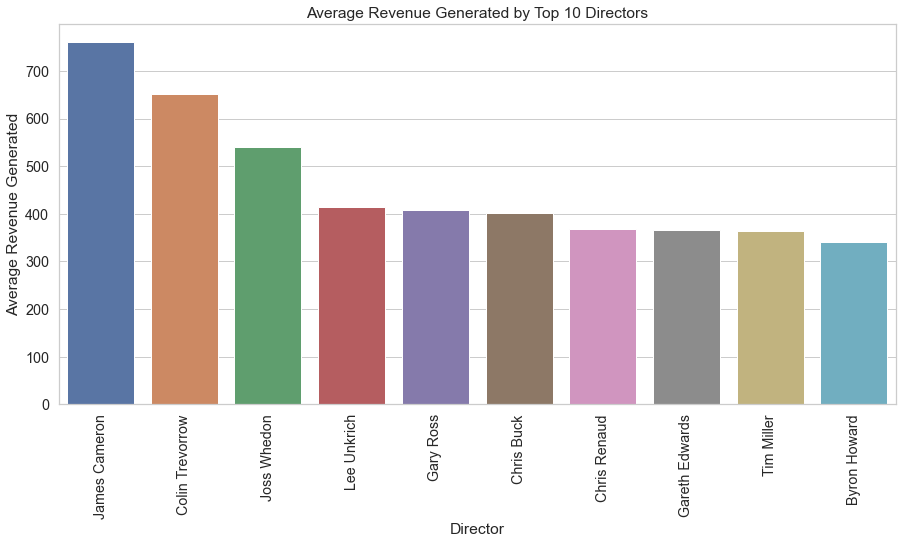

In [53]:
plt.figure(figsize = (15,7))
plot_bar = sns.barplot(data = top_10, x='Director', y='Revenue')     
plot_bar.set_title("Average Revenue Generated by Top 10 Directors")
plot_bar.set_ylabel('Average Revenue Generated')
plot_bar.set_xticklabels(top_10.Director, rotation = 90)

The top 5 names with respect to Revenue generation are as follows:
- James Cameron
- Colin Trevorrow
- Joss Whedon
- Lee Unkrich
- Gary Ross

### 1.2 Do particular directors get higher rating?

In [54]:
dir_rating = mov_df.groupby('Director').agg('mean')
top_10_rating = dir_rating.sort_values('Rating', ascending=False)[:10]
top_10_rating.reset_index(inplace=True)
top_10_rating.head(5)

,Director,Year,Runtime,Rating,Votes,Revenue,Metascore
0,Christopher Nolan,2010.0,152.6,8.68,1311817.0,303.018,74.8
1,Makoto Shinkai,2016.0,106.0,8.60,34110.0,4.680,79.0
2,Olivier Nakache,2011.0,112.0,8.60,557965.0,13.180,57.0
3,Aamir Khan,2007.0,165.0,8.50,102697.0,1.200,42.0
4,Florian Henckel von Donnersmarck,2006.0,137.0,8.50,278103.0,11.280,89.0


[Text(0, 0, 'Christopher Nolan'),
 Text(0, 0, 'Makoto Shinkai'),
 Text(0, 0, 'Olivier Nakache'),
 Text(0, 0, 'Aamir Khan'),
 Text(0, 0, 'Florian Henckel von Donnersmarck'),
 Text(0, 0, 'Naoko Yamada'),
 Text(0, 0, 'Damien Chazelle'),
 Text(0, 0, 'Thomas Vinterberg'),
 Text(0, 0, 'Lee Unkrich'),
 Text(0, 0, 'Amber Tamblyn')]

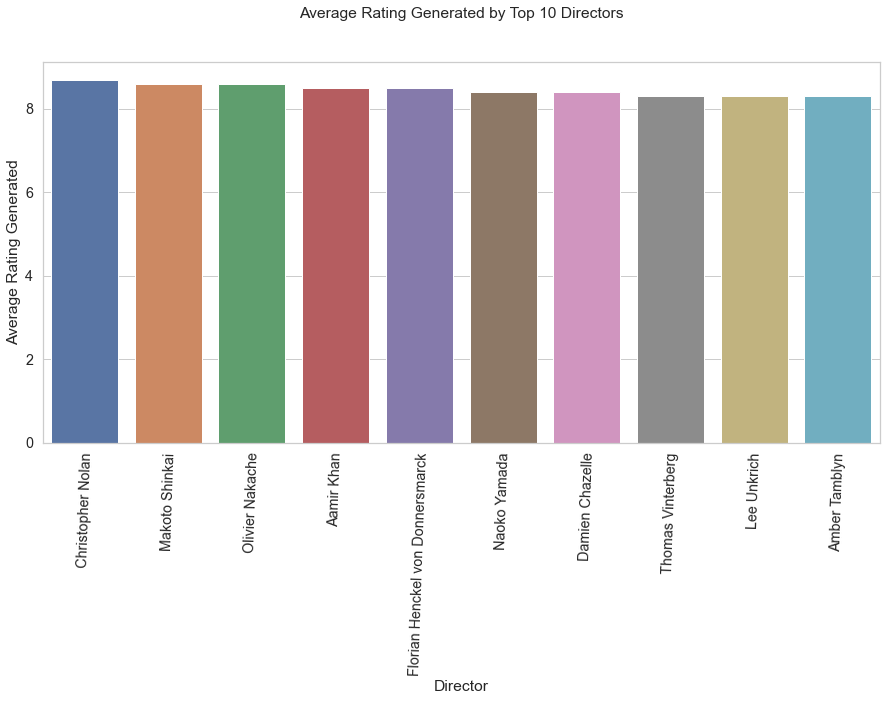

In [55]:
plt.figure(figsize = (15,7))
plot_bar = sns.barplot(data = top_10_rating, x='Director', y='Rating')     
plot_bar.set_title("Average Rating Generated by Top 10 Directors", y = 1.1)
plot_bar.set_ylabel('Average Rating Generated')
plot_bar.set_xticklabels(top_10_rating.Director, rotation = 88)

The top 5 names wrt to **Ratings** are as follows:
- Christopher Nolan
- Makoto Shinkai
- Olivier Nakache
- Aamir Khan
- Florian Henckel von Donnersmarck

### 1.3 Do particular directors receive higher ratings by critics?

In [56]:
dir_critics = mov_df.groupby('Director').agg('mean')
top_10_critic_rating = dir_critics.sort_values('Metascore', ascending=False)[:10]
top_10_critic_rating.reset_index(inplace=True)
top_10_critic_rating.head(5)

,Director,Year,Runtime,Rating,Votes,Revenue,Metascore
0,Barry Jenkins,2016.0,111.0,7.5,135095.0,27.85,99.0
1,Kenneth Lonergan,2016.0,137.0,7.9,134213.0,47.70,96.0
2,Todd Haynes,2015.0,118.0,7.2,77995.0,0.25,95.0
3,Kathryn Bigelow,2010.0,144.0,7.5,289342.0,55.71,94.5
4,Michael Goi,2011.0,85.0,4.9,6683.0,48.15,94.0


[Text(0, 0, 'Barry Jenkins'),
 Text(0, 0, 'Kenneth Lonergan'),
 Text(0, 0, 'Todd Haynes'),
 Text(0, 0, 'Kathryn Bigelow'),
 Text(0, 0, 'Michael Goi'),
 Text(0, 0, 'Maren Ade'),
 Text(0, 0, 'Tom McCarthy'),
 Text(0, 0, 'Lee Unkrich'),
 Text(0, 0, 'Richard Linklater'),
 Text(0, 0, 'Pete Docter')]

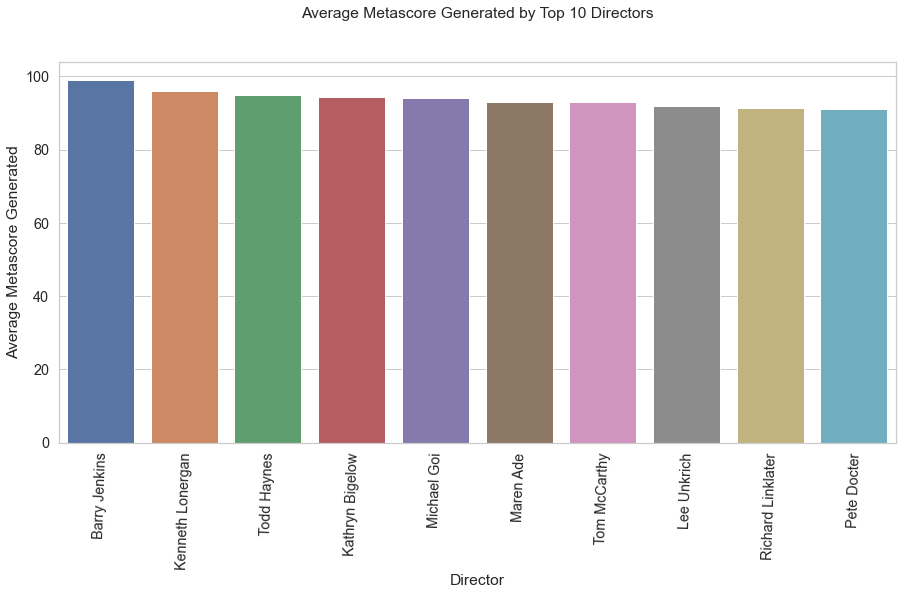

In [57]:
plt.figure(figsize = (15,7))
plot_bar = sns.barplot(data = top_10_critic_rating, x='Director', y='Metascore')     
plot_bar.set_title("Average Metascore Generated by Top 10 Directors", y = 1.1)
plot_bar.set_ylabel('Average Metascore Generated')
plot_bar.set_xticklabels(top_10_critic_rating.Director, rotation = 88)

The top 5 names wrt **Metascore** are as follows:
- Barry Jenkins
- Kenneth Lonergan
- Todd Haynes
- Kathryn Bigelow
- Michael Goi

**We have found top 10 Directors in terms of Revenue, Rating and Metascore**

## 2. How does runtime affect the success of a movie?

In [59]:
mov_df.Runtime.describe()

count    936.000000
mean     113.272436
std       18.550798
min       66.000000
25%      100.000000
50%      111.000000
75%      123.000000
max      187.000000
Name: Runtime, dtype: float64

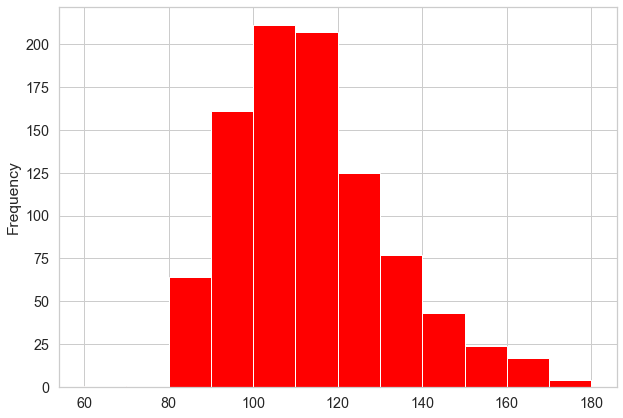

In [67]:
bins = np.arange(60,190,10)
mov_df['Runtime'].plot(kind='hist', color = 'red', bins=bins, figsize = (10,7), rot=0)

**A major chunk of the movies have Runtime between 100 - 120 mins (Roughly between 25th and 75th percentile)**

In [73]:
#Runtimes of the most revenue generating movies
runtime_rev = mov_df.groupby('Runtime').agg('mean')
top_10_runtime_rev = runtime_rev.sort_values('Revenue', ascending=False)[:10]
top_10_runtime_rev.reset_index(inplace=True)
runtime_rev.reset_index(inplace=True)
top_10_runtime_rev.head(5)

,Runtime,Year,Rating,Votes,Revenue,Metascore
0,164,2012.000000,8.500000,1.222645e+06,448.1300,78.000000
1,136,2013.000000,7.400000,5.183288e+05,424.8675,65.500000
2,162,2011.333333,7.666667,4.566813e+05,289.8300,77.333333
3,154,2008.500000,6.200000,2.925830e+05,276.2150,57.000000
4,152,2008.500000,8.400000,9.869950e+05,271.7100,79.000000


**Since, the Runtime has a big range, Let's divide these times into SHORT, MEDIUM and LONG, for the sake of ease of study**

In [74]:
runtime_bins = [65,100,123,188]            #Time Intervals
runtime_labels = ['Short', 'Medium', 'Long']
runtime_rev['Type'] = pd.cut(runtime_rev.Runtime, runtime_bins, labels=runtime_labels)
mov_df['Length_of_movie'] = pd.cut(mov_df.Runtime, runtime_bins, labels=runtime_labels)
runtime_rev.reset_index(inplace=True)
runtime_rev.head(3)

,index,Runtime,Year,Rating,Votes,Revenue,Metascore,Type
0,0,66,2016.0,7.80,4370.0,0.290,85.0,Short
1,1,73,2016.0,4.60,564.0,48.150,63.0,Short
2,2,80,2016.0,6.85,6949.5,0.535,77.5,Short


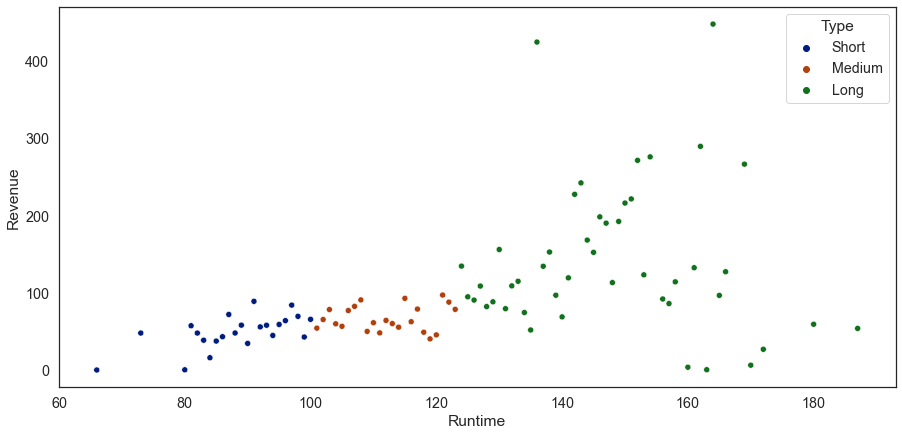

In [75]:
plt.figure(figsize = (15,7))
sns.set_style('white')
sns.scatterplot(data=runtime_rev, hue='Type', x='Runtime', y='Revenue', palette='dark')

- **Here, the CORRELATION of Revenue with Runtime changes from mild to low as Runtime increases.**
- **Short and Medium movies have mild correlation**
- **Long movies have a low correlation**

### 2.1 Which runtime interval earns higher revenue?

In [76]:
#average Revenue generated by each Type
interval_params = runtime_rev.groupby('Type').mean()[['Revenue', 'Rating', 'Metascore']]
interval_params.head()

,Revenue,Rating,Metascore
Type,,,
Short,49.538369,6.256349,59.690893
Medium,67.054576,6.735176,57.580583
Long,143.228406,7.339206,66.591349


Text(0.5, 1.02, 'Plotting of Type vs Revenue')

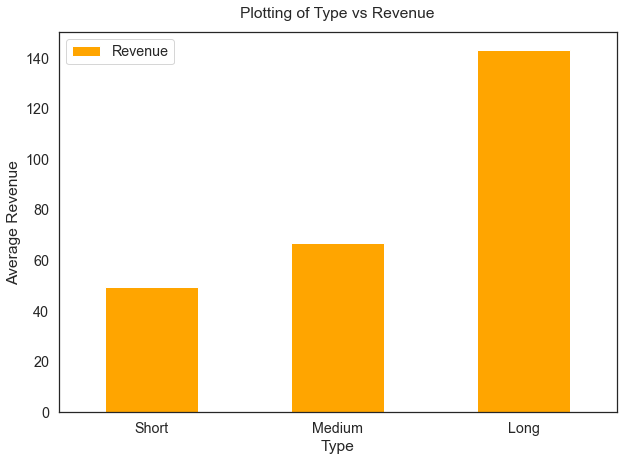

In [77]:
interval_params.plot(kind='bar', y='Revenue', color = 'Orange', grid=False,figsize = (10,7), rot=0)
plt.ylabel('Average Revenue')
plt.title('Plotting of Type vs Revenue', y=1.02)

**We can see that Long Duration movies earn a Higher Revenue and Short Duration movies earn the Least Revenue**

### 2.2 Which Runtime Interval earns higher ratings?

Text(0.5, 1.02, 'Plotting of Type vs Rating')

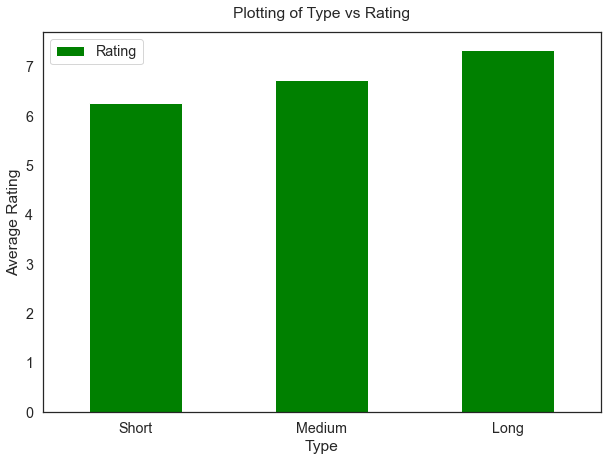

In [78]:
interval_params.plot(kind='bar', y='Rating', color = 'Green', grid=False, figsize = (10,7), rot=0)
plt.ylabel('Average Rating')
plt.title('Plotting of Type vs Rating', y=1.02)

We can see that **Long Duration** movies earn a **Higher Rating** than the rest.

### 2.3 Which Runtime Interval earns higher Critic ratings? 

Text(0.5, 1.02, 'Plotting of Type vs Metascore')

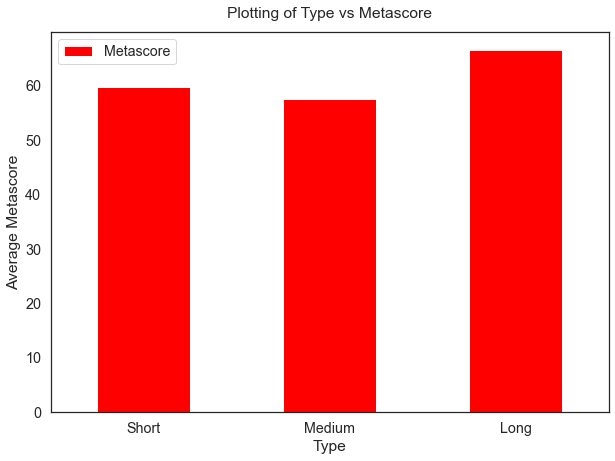

In [79]:
interval_params.plot(kind='bar', y='Metascore', color = 'red', grid=False, figsize = (10,7), rot=0)
plt.ylabel('Average Metascore')
plt.title('Plotting of Type vs Metascore', y=1.02)

We can see that Long Duration movies earn a Higher Critic Rating than the rest.


- In general **long** movies do better in terms of **Revenue**, **Rating** and **Metascores**.
- **Movies with long duration do way better than the movies of the other two categories.**
- Overall, long movies do better in these aspects combined. 

## 3. How does genre impact the success of the movie?

In [81]:
mov_df.Genre.unique()[:5]

array(['Action,Adventure,Sci-Fi', 'Adventure,Mystery,Sci-Fi',
       'Horror,Thriller', 'Animation,Comedy,Family',
       'Action,Adventure,Fantasy'], dtype=object)

In [83]:
mov_df['Genre_size'] = mov_df.Genre.str.split(',').str.len()
genre_len = mov_df.groupby('Genre_size').mean()[['Revenue', 'Rating', 'Metascore']]
genre_len.head()

,Revenue,Rating,Metascore
Genre_size,,,
1,46.688478,6.365217,58.793478
2,55.731591,6.695455,58.677273
3,94.595369,6.794712,59.121795


**So we basically have movies of 3 genre combinations. Movies with 1, 2 or 3 genre types.**



### 3.1  Which Genre Size earns more Revenue, Rating and Metascore?

Text(0.5, 1.02, 'Plotting of Genre_Size vs Revenue')

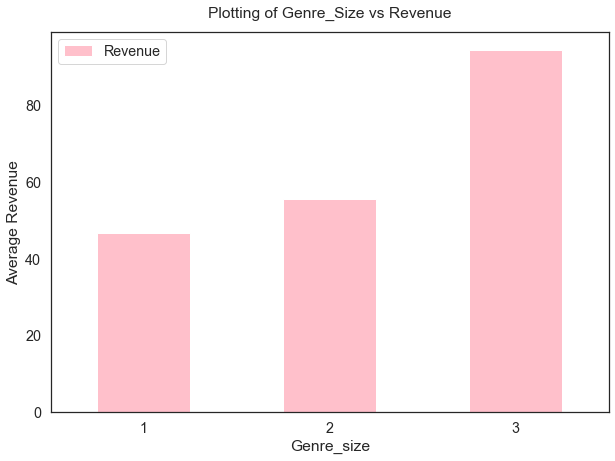

In [84]:
genre_len.plot(kind='bar', y='Revenue', color = 'pink', grid=False, figsize = (10,7), rot=0)
plt.ylabel('Average Revenue')
plt.title('Plotting of Genre_Size vs Revenue', y=1.02)

Text(0.5, 1.02, 'Plotting of Genre_Size vs Rating')

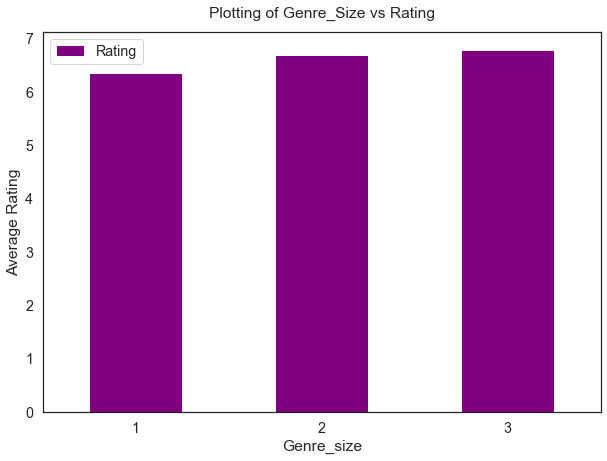

In [85]:
genre_len.plot(kind='bar', y='Rating', color = 'purple', grid=False, figsize = (10,7), rot=0)
plt.ylabel('Average Rating')
plt.title('Plotting of Genre_Size vs Rating', y=1.02)

Text(0.5, 1.02, 'Plotting of Genre_Size vs Metascore')

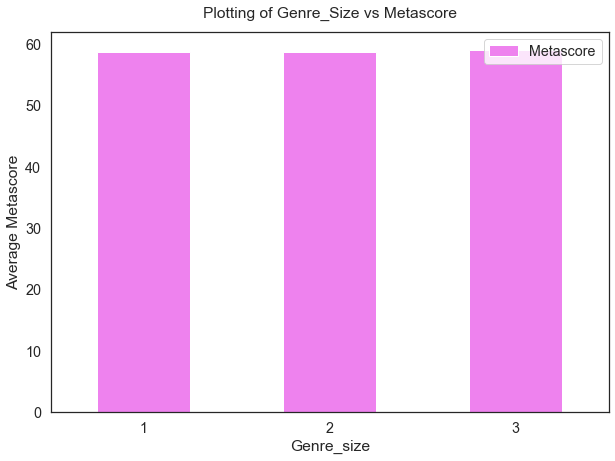

In [86]:
genre_len.plot(kind='bar', y='Metascore', color = 'violet', grid=False, figsize = (10,7), rot=0)
plt.ylabel('Average Metascore')
plt.title('Plotting of Genre_Size vs Metascore', y=1.02)

- **Movies with 3 genre combinations do much much better than the other two in terms of Revenue Generation.**
- In terms of rating, Genre doesn't significantly impact the Rating or the Critic score of a movie, but **movies with more genres do a little better than the ones with less genres.**

In [88]:
#top 10 movies of 3 genres
mov_df[mov_df.Genre_size==3].sort_values('Revenue', ascending=False)[['Title', 'Genre', 'Revenue']][:10]

,Title,Genre,Revenue
Rank,,,
51,Star Wars: Episode VII - The Force Awakens,"Action,Adventure,Fantasy",936.63
88,Avatar,"Action,Adventure,Fantasy",760.51
86,Jurassic World,"Action,Adventure,Sci-Fi",652.18
55,The Dark Knight,"Action,Crime,Drama",533.32
13,Rogue One,"Action,Adventure,Sci-Fi",532.17
120,Finding Dory,"Animation,Adventure,Comedy",486.29
95,Avengers: Age of Ultron,"Action,Adventure,Sci-Fi",458.99
579,The Hunger Games: Catching Fire,"Action,Adventure,Mystery",424.65
79,Pirates of the Caribbean: Dead Man's Chest,"Action,Adventure,Fantasy",423.03


### 3.2 Which Genre combination is more popular?

In [89]:
top_genres = mov_df[mov_df.Genre_size==3].groupby('Genre').mean()[['Revenue', 'Rating', 'Metascore']]

Text(0, 0.5, 'Average Revenue')

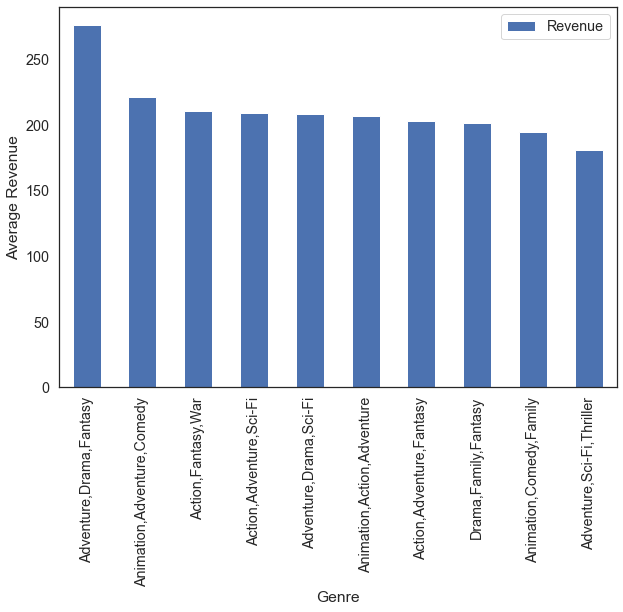

In [90]:
top_genres.sort_values('Revenue', ascending=False)[:10].plot(kind='bar', y='Revenue', figsize=(10,7))
plt.ylabel('Average Revenue')

Text(0, 0.5, 'Average Rating')

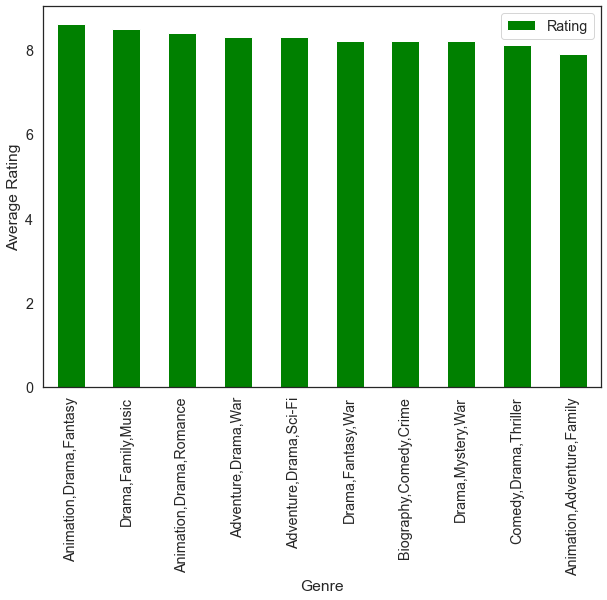

In [91]:
top_genres.sort_values('Rating', ascending=False)[:10].plot(kind='bar', y='Rating', figsize=(10,7), color='green')
plt.ylabel('Average Rating')

Text(0, 0.5, 'Average Metascore')

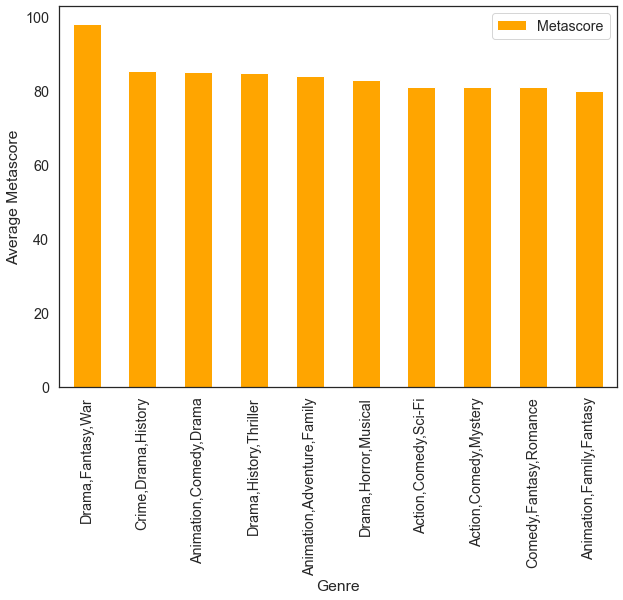

In [92]:
top_genres.sort_values('Metascore', ascending=False)[:10].plot(kind='bar', y='Metascore', figsize=(10,7), color='orange')
plt.ylabel('Average Metascore')

- Adventure, Drama, Fantasy does extremely well in terms of Revenue Generation
- There is a tough competition between the top 10 genres in terms of Ratings, but, Animation, Drama, Fantasy leads the charts
- Drama, Fantasy, War seems to do very well with the critics.

### 3.3  Which directors make movies of popular genres?

In [94]:
#Most popular genre in terms of revenue genration
dir_genre_rev = mov_df[mov_df.Genre == 'Adventure,Drama,Fantasy'][['Director', 'Revenue']] 
dir_genre_rev

,Director,Revenue
Rank,,
115,David Yates,380.96
367,Bill Condon,292.30
695,Ang Lee,124.98
926,Bill Condon,281.28
942,David Slade,300.52


In [95]:
#Most popular genre in terms of rating genration
dir_genre_rating = mov_df[mov_df.Genre == 'Animation,Drama,Fantasy']['Director'] 
dir_genre_rating

Rank
97    Makoto Shinkai
Name: Director, dtype: object

In [96]:
 #Most popular genre in terms of rating genration
dir_genre_metascore = mov_df[mov_df.Genre == 'Drama,Fantasy,War']['Director']
dir_genre_metascore

Rank
231    Guillermo del Toro
Name: Director, dtype: object

**Directors with the highest average Ratings and Revenue generation potential for a well doing genre.**

## 4. What has changed over the years?

### 4.1 How has the movie industry changed over the years?

In [97]:
mov_df.Year.unique()

array([2014, 2012, 2016, 2011, 2015, 2008, 2006, 2007, 2009, 2010, 2013],
      dtype=int64)

In [98]:
mov_df.groupby('Year')['Title'].count()

Year
2006     41
2007     46
2008     49
2009     49
2010     59
2011     58
2012     62
2013     86
2014     95
2015    123
2016    268
Name: Title, dtype: int64

Text(0.5, 1.02, 'Plot to show the growth of Film Industry over the years')

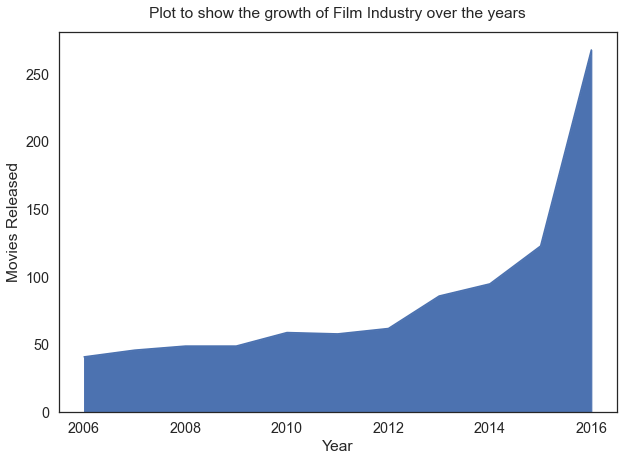

In [99]:
plt.figure(figsize=(10,7))
mov_df.groupby('Year')['Title'].count().plot.area()
plt.ylabel('Movies Released')
plt.title('Plot to show the growth of Film Industry over the years', y=1.02)

In [100]:
(mov_df[mov_df.Year == mov_df.Year.min()]['Title'].count() / mov_df[mov_df.Year == mov_df.Year.max()]['Title'].count()) * 100

15.298507462686567

- **Movie production has significantly increased over the years, opening a new market of opportunities.**
- **The growth in the past ten years has been about 15.3%, looking very promising in 2016.**

### 4.2 Has the revenue generation changed over the years?

In [102]:
mov_df.groupby('Year')['Revenue'].sum()

Year
2006     3577.48
2007     4191.56
2008     4729.37
2009     5400.99
2010     6085.95
2011     5389.24
2012     6826.39
2013     7495.41
2014     8041.63
2015     9473.19
2016    14372.59
Name: Revenue, dtype: float64

Text(0.5, 1.02, 'Plot to show the growth of Film Industry over the years')

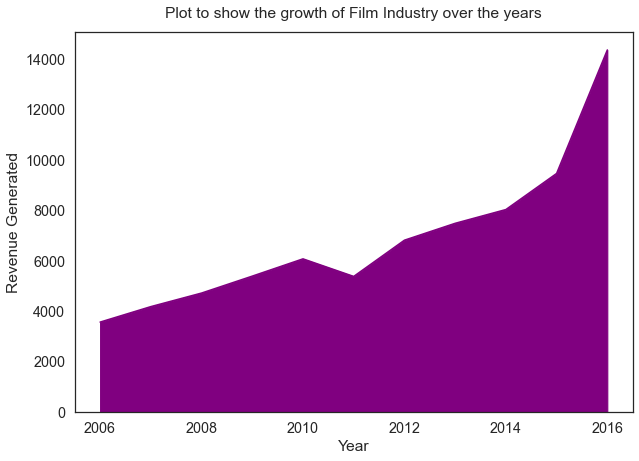

In [103]:
plt.figure(figsize=(10,7))
mov_df.groupby('Year')['Revenue'].sum().plot(kind='area', color='purple')
plt.ylabel('Revenue Generated')
plt.title('Plot to show the growth of Film Industry over the years', y=1.02)

**The overall Revenue Generated has also increased with time which implies that this industry has grown with time and still has a promising future.**

### 4.3 How has Average Revenue per movie changed over the years in the industry?

In [105]:
mov_df.groupby('Year')['Revenue'].mean()

Year
2006     87.255610
2007     91.120870
2008     96.517755
2009    110.224286
2010    103.151695
2011     92.917931
2012    110.103065
2013     87.155930
2014     84.648737
2015     77.017805
2016     53.629067
Name: Revenue, dtype: float64

Text(0.5, 1.02, 'Plot to show the growth of Film Industry over the years')

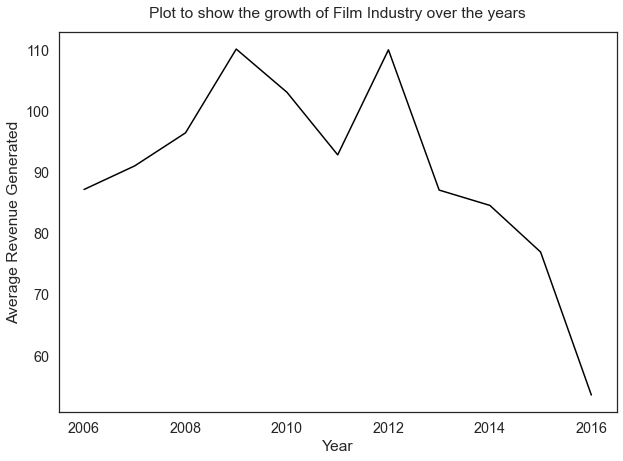

In [106]:
plt.figure(figsize=(10,7))
mov_df.groupby('Year')['Revenue'].mean().plot(kind='line', color='black')
plt.ylabel('Average Revenue Generated')
plt.title('Plot to show the growth of Film Industry over the years', y=1.02)

- A very interesting pattern, the average revenue generated per movie has **dramatically fallen down towards the end years. They have started falling from 2013 onwards.**
- A possible reason could be the increase in the number of movies released per year which causes tough competition to stand out.
- Film makers failing to understand the likes of audience and critics in a particular period of time.

### 4.4 How has Average Rating pattern changed over the years in the industry?

In [107]:
mov_df.groupby('Year')['Rating'].mean()


Year
2006    7.143902
2007    7.130435
2008    6.716327
2009    6.944898
2010    6.820339
2011    6.910345
2012    6.933871
2013    6.811628
2014    6.816842
2015    6.573984
2016    6.466791
Name: Rating, dtype: float64

Text(0.5, 1.02, 'Plot to show the growth of Film Industry over the years')

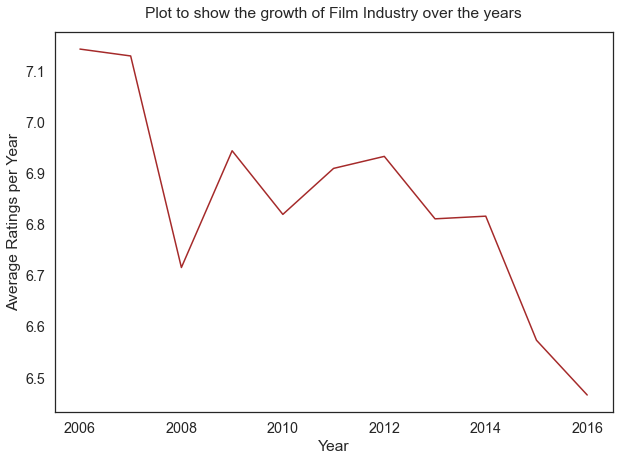

In [108]:
plt.figure(figsize=(10,7))
mov_df.groupby('Year')['Rating'].mean().plot(kind='line', color='brown')
plt.ylabel('Average Ratings per Year')
plt.title('Plot to show the growth of Film Industry over the years', y=1.02)

- **The average rating per year is falling down dramatically just like Average Revenue.**
- Just by looking at this, we can guess a few factors causing this.
    - People these days have very strong choices and are hard to impress with anything but the best.
    - Majority of the movies made are not meeting people's expectations.

In [109]:
mov_df[mov_df.Year == 2016]['Rating'].describe()

count    268.000000
mean       6.466791
std        0.990469
min        3.200000
25%        5.800000
50%        6.500000
75%        7.200000
max        8.600000
Name: Rating, dtype: float64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 <a list of 11 Text major ticklabel objects>)

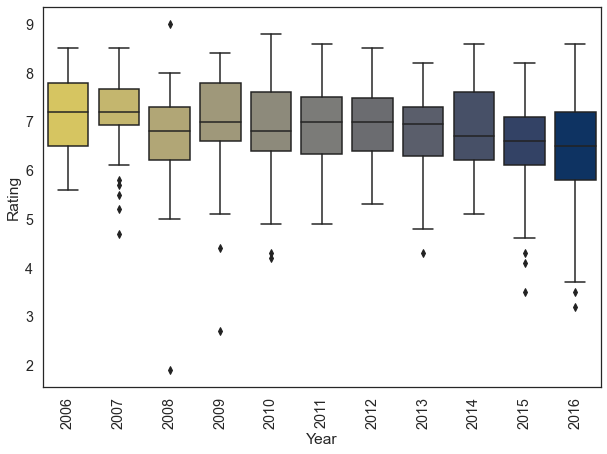

In [110]:
plt.figure(figsize=(10,7))
sns.boxplot(data=mov_df, x='Year', y='Rating', palette='cividis_r')
plt.xticks(rotation = 90)

- The Range of the year 2016 is the largest as compared to others.
- The Average performance (rating 6.5/10) of 2016 movies has been worse than the rest. The average performances have been dropping from 2013 onwards.

## 5. Why are movies doing bad?

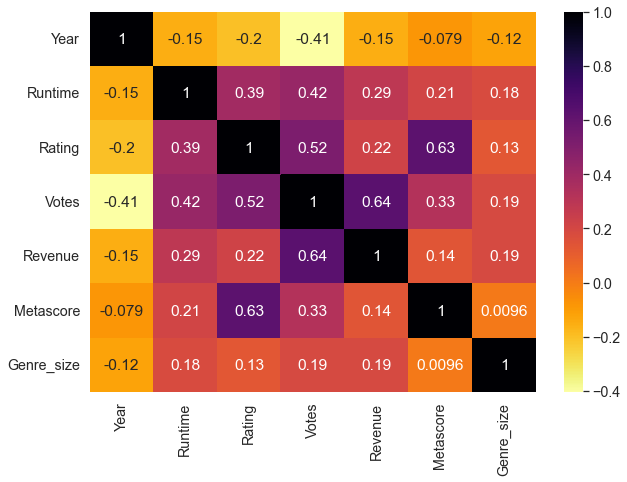

In [111]:
#correlation between different fields
plt.figure(figsize=(10,7))
sns.heatmap(mov_df.corr(), annot=True, cmap='inferno_r')

**Rating and Metascore have a high correlation. Which means, audience and critics have very similar opinions and think alike.**

### 5.1 Analysing the genre_size of movies of 2016 

Text(0.5, 1.0, 'Genre size distribution of movies made in 2016')

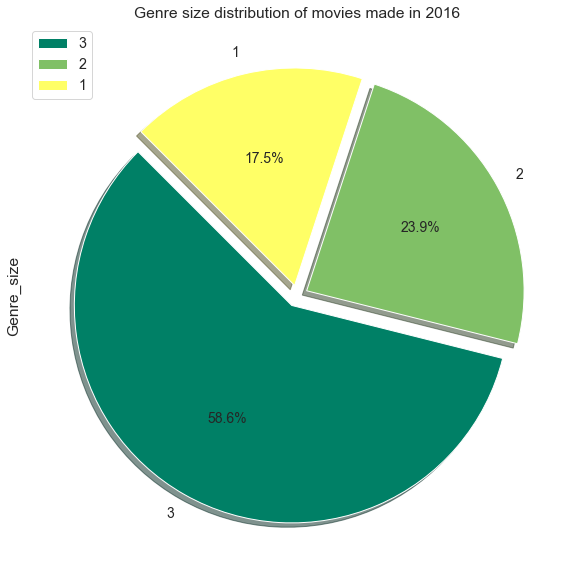

In [112]:
mov_df.query('Year == 2016').Genre_size.value_counts().plot(kind='pie', explode=[0.05,0.05,0.05], fontsize=14, autopct='%3.1f%%', 
                                                            figsize=(10,10), shadow=True, startangle=135, legend=True, cmap='summer')
plt.title("Genre size distribution of movies made in 2016")

- As we can see, **58.6% movies** have **genre_size 3**. We already know from our findings, **genre_size 3 generates the most revenue**, better ratings and are critically well acclaimed.
- There still is a scope of making more movies of genre_size 3 to expect a better overall outcome.

### 5.2 Analysing the genre of movies of 2016

In [113]:
#Adventure,Drama,Fantasy was the combination of genres producing the highest Revenue
mov_df[(mov_df.Year==2016) & (mov_df.Genre == 'Adventure,Drama,Fantasy')]['Title'].count()

0

In [114]:
#Adventure,Drama,Fantasy was the combination of genres producing the highest Rating
mov_df[(mov_df.Year==2016) & (mov_df.Genre == 'Animation,Drama,Fantasy')]['Title'].count()

1

In [115]:
#Adventure,Drama,Fantasy was the combination of genres producing the highest Metascore
mov_df[(mov_df.Year==2016) & (mov_df.Genre == 'Drama,Fantasy,War')]['Title'].count()

0

- As we had found out:

    - **Adventure,Drama,Fantasy** : the combination producing the highest **Revenue**
    - **Animation,Drama,Fantasy** : the combination producing the highest **Rating**
    - **Drama,Fantasy,War** : the combination producing the highest **Critic Score**

- But in the year **2016**, the number of movies made in these genres is as follows:

    - **Adventure,Drama,Fantasy : 0**
    - **Animation,Drama,Fantasy : 1**
    - **Drama,Fantasy,War : 0**

**This was a very big opportunity that the movie makers had missed out on. Genre combinations that could potentially earn high Revenues and Rating and Critics Scores were not focused on.**

### 5.3 Analysing the Runtime of movies of 2016

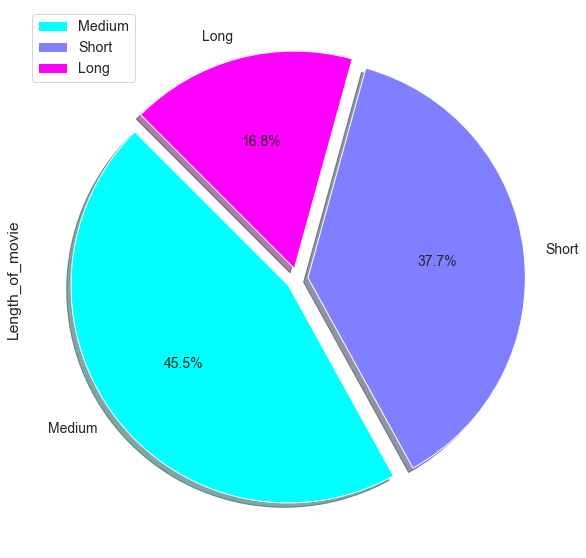

In [116]:
mov_df.query('Year==2016').Length_of_movie.value_counts().plot(kind='pie', explode=[0.05,0.05,0.05], fontsize=14, autopct='%3.1f%%', 
                                                            figsize=(10,10), shadow=True, startangle=135, legend=True, cmap='cool')

As per our findings, **long movies tend to do better in terms of Revenue generation, Rating and Metascore.**

- **But in 2016, only 16.8% movies were long, rest were short or medium length movies.**

### 5.4 Analysing the Directors of movies of 2016

In [117]:
#the top 5 directors in terms of revenue generation
mov_df.sort_values('Revenue', ascending=False)[['Director', 'Revenue']][:5]

,Director,Revenue
Rank,,
51,J.J. Abrams,936.63
88,James Cameron,760.51
86,Colin Trevorrow,652.18
77,Joss Whedon,623.28
55,Christopher Nolan,533.32


In [118]:
#top 5 directors in terms of revenue in the year 2016
mov_df.query('Year == 2016').sort_values('Revenue', ascending=False)[['Director', 'Revenue']][:5]

,Director,Revenue
Rank,,
13,Gareth Edwards,532.17
120,Andrew Stanton,486.29
36,Anthony Russo,408.08
16,Chris Renaud,368.31
126,Jon Favreau,364.00


As we can see, the directors in 2016 are not among the top 5 names from the entire record set.


In [120]:
#list of average ratings over the years
mov_df.groupby('Year').mean()['Rating']

Year
2006    7.143902
2007    7.130435
2008    6.716327
2009    6.944898
2010    6.820339
2011    6.910345
2012    6.933871
2013    6.811628
2014    6.816842
2015    6.573984
2016    6.466791
Name: Rating, dtype: float64

In [121]:
#the top 5 directors in terms of ratings
mov_df.sort_values('Rating', ascending=False)[['Director', 'Rating']][:5]

,Director,Rating
Rank,,
55,Christopher Nolan,9.0
81,Christopher Nolan,8.8
37,Christopher Nolan,8.6
250,Olivier Nakache,8.6
97,Makoto Shinkai,8.6


In [122]:
#top 5 directors in terms of ratings in the year 2016
mov_df.query('Year == 2016').sort_values('Rating', ascending=False)[['Director', 'Rating']][:5]

,Director,Rating
Rank,,
97,Makoto Shinkai,8.6
862,Naoko Yamada,8.4
7,Damien Chazelle,8.3
479,Amber Tamblyn,8.3
17,Mel Gibson,8.2


The Average Ratings received in 2016 is the lowest, but we do have some movies made by well rated directors


In [123]:
#list of average metascores over the years
mov_df.groupby('Year').mean()['Metascore']

Year
2006    64.414634
2007    64.500000
2008    57.408163
2009    57.122449
2010    59.389831
2011    61.724138
2012    61.145161
2013    58.534884
2014    57.315789
2015    57.040650
2016    58.283582
Name: Metascore, dtype: float64

**The movies in 2016 have done decently well in terms of critic scores**

## Conclusion

- **The best directors were found out on the basis of Revenue generation, Ratings and Critic scores.**

    - James Cameron : Revenue
    - Christopher Nolan : Rating
    - Barry Jenkins : Metascore
        - Upon analysing the directors of 2016 movies, it was found that None of these top ranking directors made movies in that year. In fact, out of the top 5 list in every category, only Makoto Shinkai (High Rated) had released his film in 2016.

2. **Runtime of movies were analysed.**

    - It was found that movies with Long duration (> 123 mins) did exceptionally well in terms of Revenue generation, and also did better than the rest in terms of Ratings and Critic scores
    - But, only 16.8% long movies were made in 2016. This was a very big opportunity missed in terms of generating Revenue and also making people and critics pleasing movies.

3. **Genres of movies were analysed to find a trend.**

    - As the genre_size (numbers of genres present in a movie) increased, the rating and metascore increased.
    - But, Revenue, significantly increased for genre_size = 3.
    - 58.6% movies in 2016 had a genre combination of 3.
    - Adventure,Drama,Fantasy - Most popular genre that earned the highest Revenue.
    - Animation,Drama,Fantasy - Most popular genre that earned the highest User Rating.
    - Drama,Fantasy,War - Most popular genre that earned the highest Metascore.
    - But in the year 2016, the number of movies made in these genres is as follows:
        - Adventure,Drama,Fantasy : 0
        - Animation,Drama,Fantasy : 1
        - Drama,Fantasy,War : 0

4. **We found out Directors of most popular genre movies:**

    - David Yates made the highest Revenue genrating movie in the genre - Adventure,Drama,Fantasy.
    - Makoto Shinkai made the highest Rated movies in the genre - Animation,Drama,Fantasy.
    - Guillermo del Toro made the most critically acclaimed movie in the genre - Drama,Fantasy,War.

5. **The industry's growth is very promising with respect to the number of movies made and Revenue earned. It has grown around 15% in 10 years (from 2006 to 2016).**

    - Having said that, Average Revenue and Average Rating (Popularity) of movies have shown a Negative Trend.
    - This is can be credited to the following facts:
        - With an increase in the number of movies produced each year, the competitionn increases and the movies will need an extra edge to stand out in this tough competition.
        - With time, people's life has become very busy and stressful, they turn to Entertainment for stress busting. And the movie needs to look promising, to attract their attention. No one can afford to waste their time and money on a weak
        - Due to numerous options available, the movie has to stand out in terms of the above mentioned factors to hold people in place.
        - the film has to be as close to perfection as possible as the attention span of people has also reduced with time. It is important to give them something to make them stay till the end.

6. **Rating and Metascore are highly correlated. It means that Audience and Critics think along similar lines. Movies with high Ratings and Metascore have also earned high Revenue, which does make sense and is very natural.**



## Actionable Insights

- **Movies need to be strategically plannned to be more appealing to audience and critics, which will in turn result in higher Revenue.** The following are some suggested features which need to be worked upon:

    - Making movies with well acclaimed directors will bring in more Revenue, better Ratings and Metascore.

- **We know from analysis that Long movies ( >123 mins) have had better Ratings, Metascore and high Revenues.**

-  Genre size plays an important role too. Movies with 3 Genre combination have been very well acclaimed. The most popular genres found are :

    - Adventure,Drama,Fantasy,
    - Animation,Drama,Fantasy and
    - Drama,Fantasy,War.
- They have proved to be very engaging.
-  **Movies that are audience and critics pleasing, earn more Revenue.**